# Load SRGAN and make helper function

Before starting project, we have to load trained SRGAN and make helper function for later use.

In [2]:
%%bash
wget https://aiffelstaticprd.blob.core.windows.net/media/documents/srgan_G.h5
mv srgan_G.h5 ~/aiffel/super_resolution

--2021-09-14 07:00:03--  https://aiffelstaticprd.blob.core.windows.net/media/documents/srgan_G.h5
Resolving aiffelstaticprd.blob.core.windows.net (aiffelstaticprd.blob.core.windows.net)... 52.239.148.4
Connecting to aiffelstaticprd.blob.core.windows.net (aiffelstaticprd.blob.core.windows.net)|52.239.148.4|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6578112 (6.3M) [application/x-hdf]
Saving to: ‘srgan_G.h5’

     0K .......... .......... .......... .......... ..........  0%  167K 38s
    50K .......... .......... .......... .......... ..........  1%  332K 28s
   100K .......... .......... .......... .......... ..........  2% 75.1M 19s
   150K .......... .......... .......... .......... ..........  3%  333K 19s
   200K .......... .......... .......... .......... ..........  3%  109M 15s
   250K .......... .......... .......... .......... ..........  4%  333K 15s
   300K .......... .......... .......... .......... ..........  5%  262M 13s
   350K .......... .

In [3]:
import tensorflow as tf
import os

model_file = os.getenv('HOME')+'/aiffel/super_resolution/srgan_G.h5'
srgan = tf.keras.models.load_model(model_file)

In [4]:
def apply_srgan(image):
    image = tf.cast(image[np.newaxis, ...], tf.float32)
    sr = srgan.predict(image)
    sr = tf.clip_by_value(sr, 0, 255)
    sr = tf.round(sr)
    sr = tf.cast(sr, tf.uint8)
    return np.array(sr)[0]

# Project1: 직접 고른 이미지로 SRGAN 실험하기

## 프로젝트 1-1.

### 1. 높은 해상도를 가진 이미지를 불러오기

In [5]:
import os
from pathlib import Path
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [6]:
data_path = Path(os.getenv('HOME') + '/aiffel/exploration-16-gan-resolution/image')
file_path = data_path / 'alisson.jpeg'

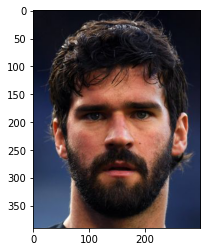

In [7]:
alisson = Image.open(file_path)
plt.imshow(alisson)

Convert the image to ndarray for applying resize via cv2.

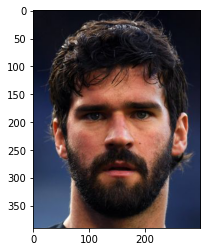

In [8]:
alisson = np.array(alisson)
# groot = groot[...,:3]
plt.imshow(alisson)

### 2. Bicubic Interpolation 적용

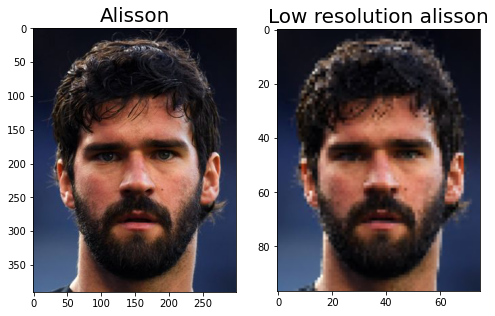

In [9]:
lr_alisson = cv2.resize(
    alisson,
    dsize=((alisson.shape[1]//4), (alisson.shape[0]//4)), ## x, y 순서가 바뀜!
    interpolation=cv2.INTER_CUBIC)

images = [alisson, lr_alisson]
titles = ["Alisson", "Low resolution alisson"]

fig, axes = plt.subplots(figsize=(8, 16), nrows=1, ncols=2)
axs = axes.ravel()
for i, (image, title) in enumerate(zip(images, titles)):
    axs[i].imshow(image)
    axs[i].set_title(title, fontsize=20)

### 3. `apply_srgan`

In [10]:
srgan_alisson = apply_srgan(lr_alisson)

In [11]:
srgan_alisson.shape

(388, 300, 3)

In [12]:
images.append(srgan_alisson)
titles.append("SRGAN alisson")

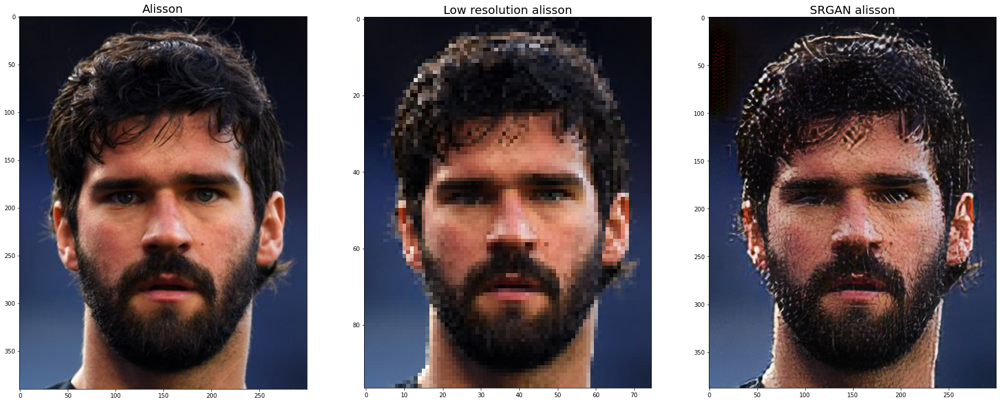

In [13]:
fig, axes = plt.subplots(figsize=(30, 16), nrows=1, ncols=3)
axs = axes.ravel()
for i, (image, title) in enumerate(zip(images, titles)):
    axs[i].imshow(image)
    axs[i].set_title(title, fontsize=20)

### 4. Bicubic interpolation을 이용해 픽셀 수를 다시 늘리기.

In [14]:
hr_bicubic_alisson = cv2.resize(
    lr_alisson,
    dsize=(alisson.shape[1], alisson.shape[0]),
    interpolation=cv2.INTER_CUBIC
)

In [15]:
images.append(hr_bicubic_alisson)
titles.append("Bicubic alisson")

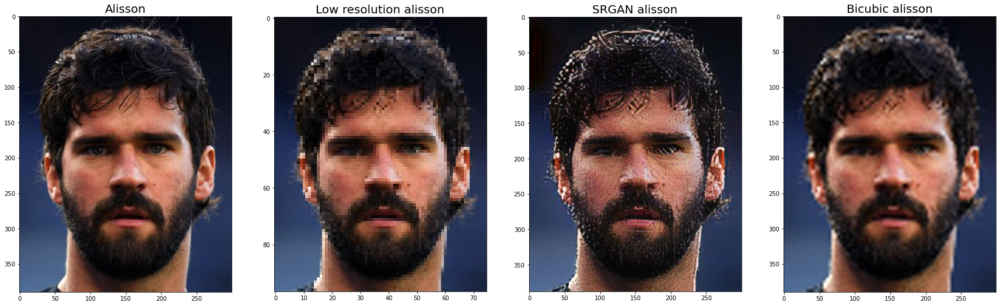

In [16]:
fig, axes = plt.subplots(figsize=(30, 16), nrows=1, ncols=4)
axs = axes.ravel()
for i, (image, title) in enumerate(zip(images, titles)):
    axs[i].imshow(image)
    axs[i].set_title(title, fontsize=20)

차례대로 

1. (1) 원본

2. (2) Bicubic으로 픽셀수를 줄인 이미지

3. (3) (2)를 SRGAN으로 복원한 이미지 

4. (4) (2)를 bicubic으로 복원한 이미지

In [17]:
print("Shape of the original picture: ", alisson.shape)
print("Shape of the Low resolution picture: ", lr_alisson.shape)
print("Shape of the SRGAN picture: ", srgan_alisson.shape)
print("Shape of the Bicubic picture: ", hr_bicubic_alisson.shape)

Shape of the original picture:  (390, 300, 3)
Shape of the Low resolution picture:  (97, 75, 3)
Shape of the SRGAN picture:  (388, 300, 3)
Shape of the Bicubic picture:  (390, 300, 3)


For computating the metric, resize the 'SRGAN picture' to (390, 300, 3)

In [18]:
srgan_alisson = cv2.resize(
    srgan_alisson,
    dsize=(alisson.shape[1], alisson.shape[0]),
    interpolation=cv2.INTER_CUBIC
)

### 5. 시각화

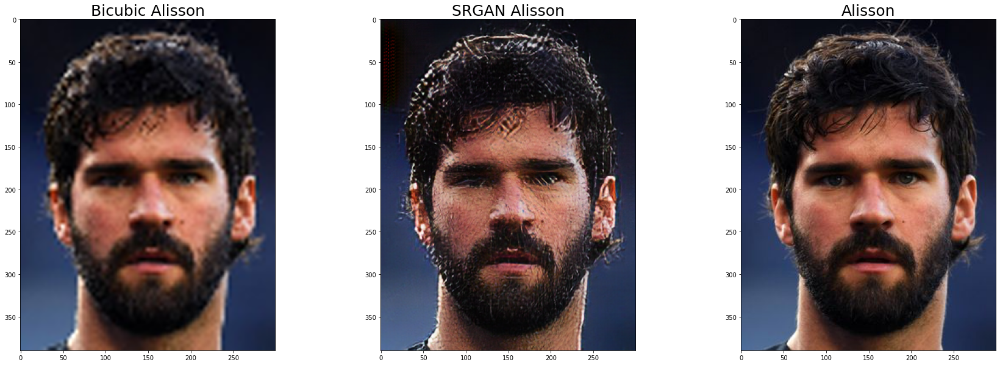

In [19]:
images = [hr_bicubic_alisson, srgan_alisson, alisson]
titles = ["Bicubic Alisson", "SRGAN Alisson", "Alisson"]

fig, axes = plt.subplots(figsize=(30, 10), nrows=1, ncols=3)
axs = axes.ravel()

for i, (image, title) in enumerate(zip(images, titles)):
    axs[i].imshow(image)
    axs[i].set_title(title, fontsize=25)

### 6. 결과분석

In [20]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
print("BICUBIC's PSNR: ", peak_signal_noise_ratio(alisson, hr_bicubic_alisson))
print("SRGAN's PSNR: ", peak_signal_noise_ratio(alisson, srgan_alisson))

print("*" * 25)

print("BICUBIC's SSIM: ", structural_similarity(alisson, hr_bicubic_alisson, multichannel=True))
print("SRGAN's SSIM: ", structural_similarity(alisson, srgan_alisson, multichannel=True))

BICUBIC's PSNR:  27.10538125913901
SRGAN's PSNR:  21.73747245189301
*************************
BICUBIC's SSIM:  0.8061757510095268
SRGAN's SSIM:  0.5792154090041098


`DIV2K`의 학습 데이터셋은 일반적으로 자연, 동물, 건물등의 이미지가 있습니다. 따라서 인물의 경우 제대로 복원(Upsampling)을 하지 못한 점을 확인할 수 있습니다. 시각화를 통해 살펴본 결과로도 알 수 있고, 실제 PSNR, SSIM 스코어를 확인해봐도 SRGAN의 성능이 떨어짐을 확인할 수 있습니다.

## 프로젝트 1-1-(2) 다른 이미지로 해보기

In [21]:
data_path = Path(os.getenv('HOME') + '/aiffel/exploration-16-gan-resolution/image')
file_path = data_path / 'iris.jpeg'

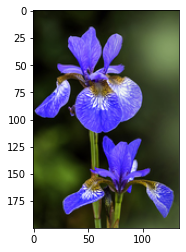

In [22]:
iris = Image.open(file_path)
plt.imshow(iris)

Convert the image to ndarray for applying resize via cv2.

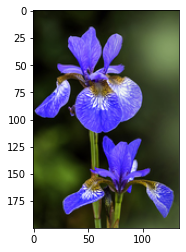

In [23]:
iris = np.array(iris)
# groot = groot[...,:3]
plt.imshow(iris)

### 2. Bicubic Interpolation 적용

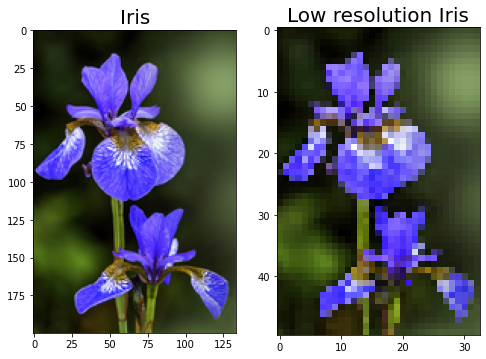

In [24]:
lr_iris = cv2.resize(
    iris,
    dsize=((iris.shape[1]//4), (iris.shape[0]//4)), ## x, y 순서가 바뀜!
    interpolation=cv2.INTER_CUBIC)

images = [iris, lr_iris]
titles = ["Iris", "Low resolution Iris"]

fig, axes = plt.subplots(figsize=(8, 16), nrows=1, ncols=2)
axs = axes.ravel()
for i, (image, title) in enumerate(zip(images, titles)):
    axs[i].imshow(image)
    axs[i].set_title(title, fontsize=20)

### 3. `apply_srgan`

In [25]:
srgan_iris = apply_srgan(lr_iris)

In [26]:
srgan_iris.shape

(200, 132, 3)

In [27]:
images.append(srgan_iris)
titles.append("SRGAN Iris")

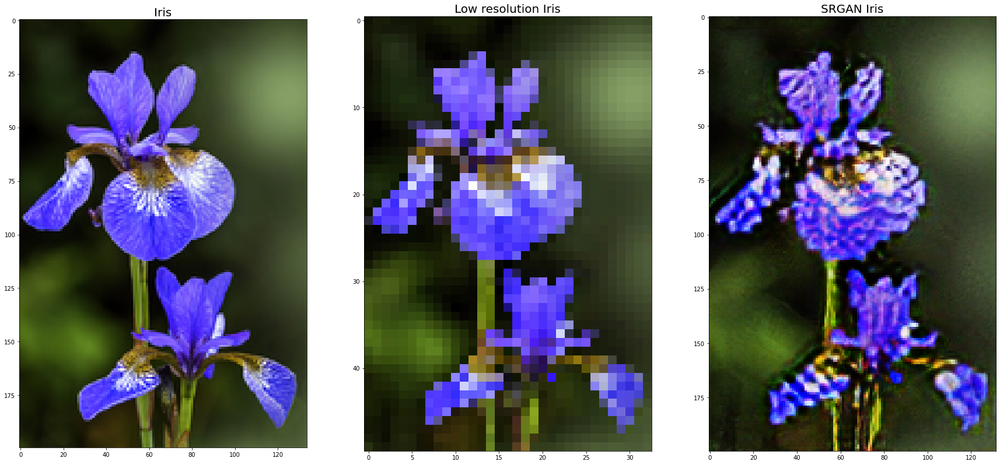

In [28]:
fig, axes = plt.subplots(figsize=(30, 16), nrows=1, ncols=3)
axs = axes.ravel()
for i, (image, title) in enumerate(zip(images, titles)):
    axs[i].imshow(image)
    axs[i].set_title(title, fontsize=20)

### 4. Bicubic interpolation을 이용해 픽셀 수를 다시 늘리기.

In [29]:
hr_bicubic_iris = cv2.resize(
    lr_iris,
    dsize=(iris.shape[1], iris.shape[0]),
    interpolation=cv2.INTER_CUBIC
)

In [30]:
images.append(hr_bicubic_iris)
titles.append("Bicubic Iris")

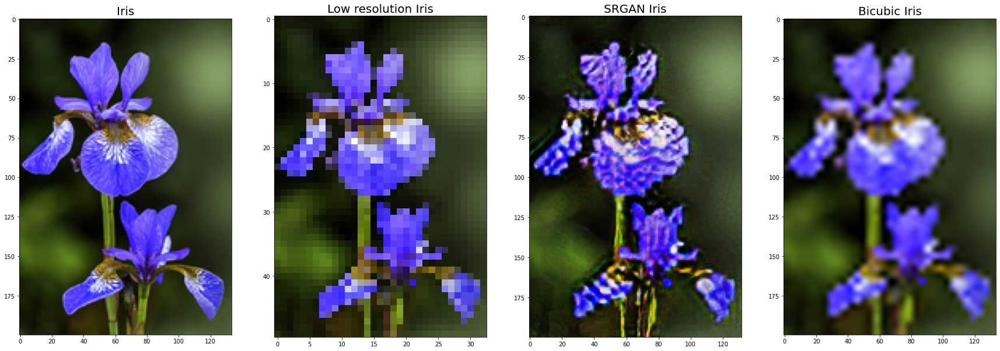

In [31]:
fig, axes = plt.subplots(figsize=(30, 16), nrows=1, ncols=4)
axs = axes.ravel()
for i, (image, title) in enumerate(zip(images, titles)):
    axs[i].imshow(image)
    axs[i].set_title(title, fontsize=20)

차례대로 

1. (1) 원본

2. (2) Bicubic으로 픽셀수를 줄인 이미지

3. (3) (2)를 SRGAN으로 복원한 이미지 

4. (4) (2)를 bicubic으로 복원한 이미지

In [32]:
print("Shape of the original picture: ", iris.shape)
print("Shape of the Low resolution picture: ", lr_iris.shape)
print("Shape of the SRGAN picture: ", srgan_iris.shape)
print("Shape of the Bicubic picture: ", hr_bicubic_iris.shape)

Shape of the original picture:  (200, 134, 3)
Shape of the Low resolution picture:  (50, 33, 3)
Shape of the SRGAN picture:  (200, 132, 3)
Shape of the Bicubic picture:  (200, 134, 3)


For computating the metric, resize the 'SRGAN picture' to (200, 134, 3)

In [33]:
srgan_iris = cv2.resize(
    srgan_iris,
    dsize=(iris.shape[1], iris.shape[0]),
    interpolation=cv2.INTER_CUBIC
)

### 5. 시각화

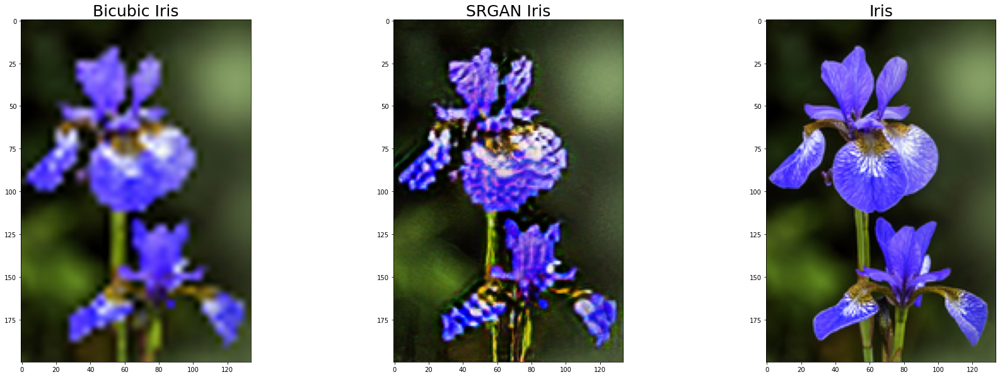

In [34]:
images = [hr_bicubic_iris, srgan_iris, iris]
titles = ["Bicubic Iris", "SRGAN Iris", "Iris"]

fig, axes = plt.subplots(figsize=(30, 10), nrows=1, ncols=3)
axs = axes.ravel()

for i, (image, title) in enumerate(zip(images, titles)):
    axs[i].imshow(image)
    axs[i].set_title(title, fontsize=25)

### 6. 결과분석

In [35]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
print("BICUBIC's PSNR: ", peak_signal_noise_ratio(iris, hr_bicubic_iris))
print("SRGAN's PSNR: ", peak_signal_noise_ratio(iris, srgan_iris))

print("*" * 25)

print("BICUBIC's SSIM: ", structural_similarity(iris, hr_bicubic_iris, multichannel=True))
print("SRGAN's SSIM: ", structural_similarity(iris, srgan_iris, multichannel=True))

BICUBIC's PSNR:  21.428028376028774
SRGAN's PSNR:  17.695909739390586
*************************
BICUBIC's SSIM:  0.7809964745573653
SRGAN's SSIM:  0.6415184877566664


Iris의 경우에는 꽃 이미지로 잘 분류할 줄 알았는데, 이번에도 시각화, PSNR, SSIM으로 확인해봤을 때 성능이 훨씬 떨어짐을 볼 수 있습니다.

## 프로젝트 1-1-(3) 다른 이미지로 해보기

In [36]:
import os
from pathlib import Path
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [37]:
data_path = Path(os.getenv('HOME') + '/aiffel/exploration-16-gan-resolution/image')
file_path = data_path / 'dog.jpeg'

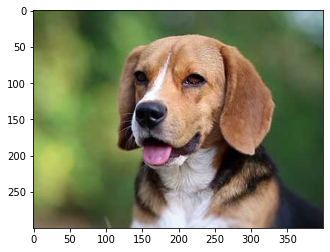

In [38]:
dog = Image.open(file_path)
plt.imshow(dog)

Convert the image to ndarray for applying resize via cv2.

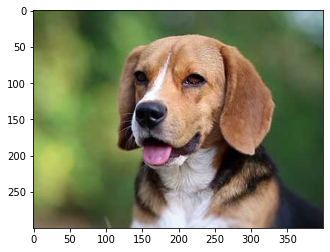

In [39]:
dog = np.array(dog)
# groot = groot[...,:3]
plt.imshow(dog)

### 2. Bicubic Interpolation 적용

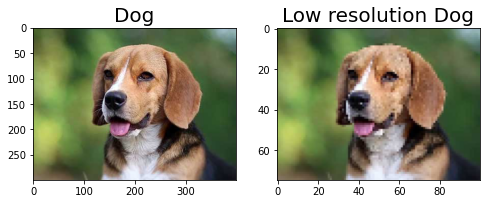

In [40]:
lr_dog = cv2.resize(
    dog,
    dsize=((dog.shape[1]//4), (dog.shape[0]//4)), ## x, y 순서가 바뀜!
    interpolation=cv2.INTER_CUBIC)

images = [dog, lr_dog]
titles = ["Dog", "Low resolution Dog"]

fig, axes = plt.subplots(figsize=(8, 16), nrows=1, ncols=2)
axs = axes.ravel()
for i, (image, title) in enumerate(zip(images, titles)):
    axs[i].imshow(image)
    axs[i].set_title(title, fontsize=20)

### 3. `apply_srgan`

In [42]:
srgan_dog = apply_srgan(lr_dog)

In [43]:
srgan_dog.shape

(300, 400, 3)

In [44]:
images.append(srgan_dog)
titles.append("SRGAN Dog")

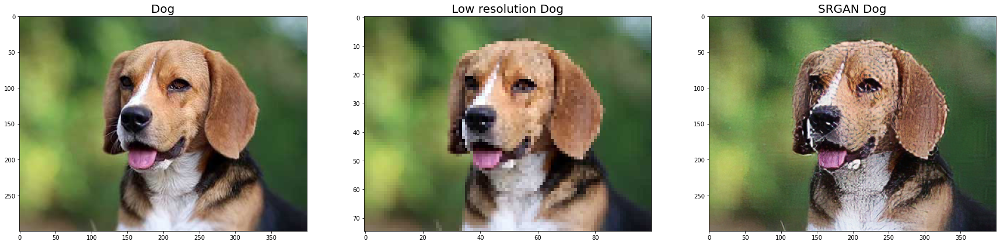

In [45]:
fig, axes = plt.subplots(figsize=(30, 16), nrows=1, ncols=3)
axs = axes.ravel()
for i, (image, title) in enumerate(zip(images, titles)):
    axs[i].imshow(image)
    axs[i].set_title(title, fontsize=20)

### 4. Bicubic interpolation을 이용해 픽셀 수를 다시 늘리기.

In [46]:
hr_bicubic_dog = cv2.resize(
    lr_dog,
    dsize=(dog.shape[1], dog.shape[0]),
    interpolation=cv2.INTER_CUBIC
)

In [47]:
images.append(hr_bicubic_dog)
titles.append("Bicubic Dog")

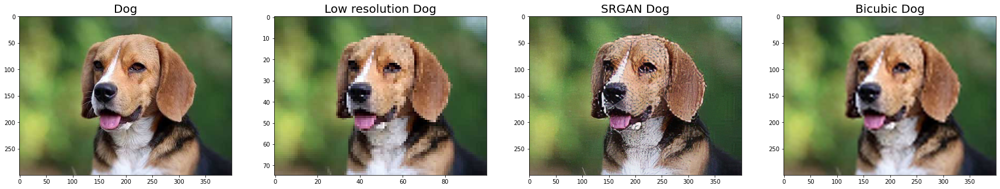

In [48]:
fig, axes = plt.subplots(figsize=(30, 16), nrows=1, ncols=4)
axs = axes.ravel()
for i, (image, title) in enumerate(zip(images, titles)):
    axs[i].imshow(image)
    axs[i].set_title(title, fontsize=20)

차례대로 

1. (1) 원본

2. (2) Bicubic으로 픽셀수를 줄인 이미지

3. (3) (2)를 SRGAN으로 복원한 이미지 

4. (4) (2)를 bicubic으로 복원한 이미지

In [49]:
print("Shape of the original picture: ", dog.shape)
print("Shape of the Low resolution picture: ", lr_dog.shape)
print("Shape of the SRGAN picture: ", srgan_dog.shape)
print("Shape of the Bicubic picture: ", hr_bicubic_dog.shape)

Shape of the original picture:  (300, 400, 3)
Shape of the Low resolution picture:  (75, 100, 3)
Shape of the SRGAN picture:  (300, 400, 3)
Shape of the Bicubic picture:  (300, 400, 3)


### 5. 시각화

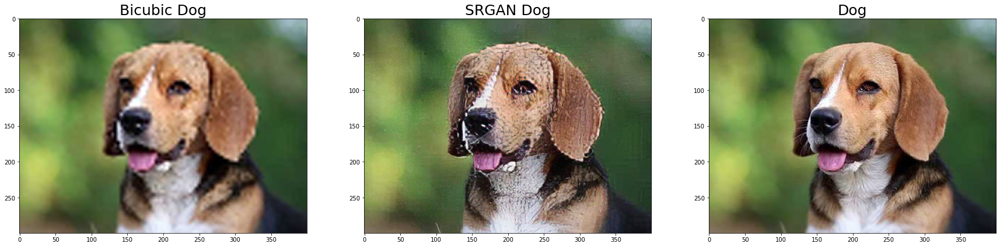

In [50]:
images = [hr_bicubic_dog, srgan_dog, dog]
titles = ["Bicubic Dog", "SRGAN Dog", "Dog"]

fig, axes = plt.subplots(figsize=(30, 10), nrows=1, ncols=3)
axs = axes.ravel()

for i, (image, title) in enumerate(zip(images, titles)):
    axs[i].imshow(image)
    axs[i].set_title(title, fontsize=25)

### 6. 결과분석

In [51]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
print("BICUBIC's PSNR: ", peak_signal_noise_ratio(dog, hr_bicubic_dog))
print("SRGAN's PSNR: ", peak_signal_noise_ratio(dog, srgan_dog))

print("*" * 25)

print("BICUBIC's SSIM: ", structural_similarity(dog, hr_bicubic_dog, multichannel=True))
print("SRGAN's SSIM: ", structural_similarity(dog, srgan_dog, multichannel=True))

BICUBIC's PSNR:  28.707188532847205
SRGAN's PSNR:  23.300208014245285
*************************
BICUBIC's SSIM:  0.8733892237553248
SRGAN's SSIM:  0.6950981544487248


마지막으로 건물을 대상으로 잘 되는 지 확인을 해보겠습니다.

## 프로젝트 1-1-(3) 다른 이미지로 해보기

In [399]:
import os
from pathlib import Path
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [400]:
data_path = Path(os.getenv('HOME') + '/aiffel/exploration-16-gan-resolution/image')
#file_path = data_path / 'building_3.jpeg'
file_path = data_path / 'betafish.jpeg'


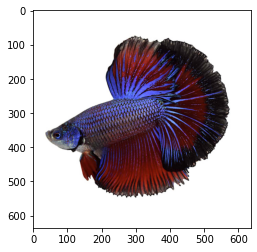

In [401]:
fish = Image.open(file_path)
plt.imshow(fish)

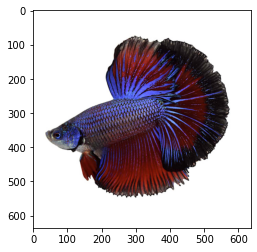

In [402]:
fish = np.array(fish)
plt.imshow(fish)

이미지가 너무 크기 때문에 적당히 잘라내주겠습니다.

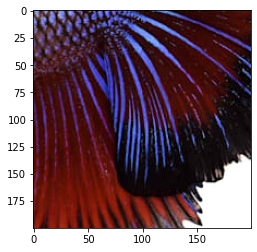

In [403]:
def crop(image, left_top, x=50, y=100):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1]+y), :]

crop_fish = crop(fish, (300, 300), x=200, y=200)
plt.imshow(crop_fish)

### 2. Bicubic Interpolation 적용

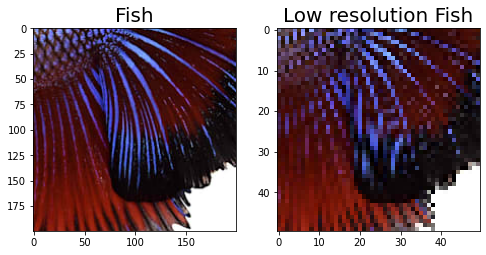

In [404]:
lr_fish = cv2.resize(
    crop_fish,
    dsize=((crop_fish.shape[1]//4), (crop_fish.shape[0]//4)), ## x, y 순서가 바뀜!
    interpolation=cv2.INTER_CUBIC)

images = [crop_fish, lr_fish]
titles = ["Fish", "Low resolution Fish"]

fig, axes = plt.subplots(figsize=(8, 16), nrows=1, ncols=2)
axs = axes.ravel()
for i, (image, title) in enumerate(zip(images, titles)):
    axs[i].imshow(image)
    axs[i].set_title(title, fontsize=20)

### 3. `apply_srgan`

In [405]:
srgan_fish = apply_srgan(lr_fish)

In [406]:
srgan_fish.shape

(200, 200, 3)

In [407]:
images.append(srgan_fish)
titles.append("SRGAN Fish")

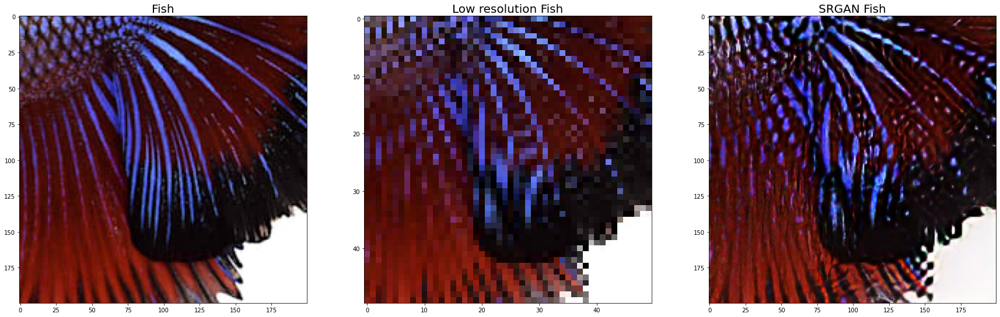

In [408]:
fig, axes = plt.subplots(figsize=(30, 16), nrows=1, ncols=3)
axs = axes.ravel()
for i, (image, title) in enumerate(zip(images, titles)):
    axs[i].imshow(image)
    axs[i].set_title(title, fontsize=20)

### 4. Bicubic interpolation을 이용해 픽셀 수를 다시 늘리기.

In [409]:
hr_bicubic_fish = cv2.resize(
    lr_fish,
    dsize=(crop_fish.shape[1], crop_fish.shape[0]),
    interpolation=cv2.INTER_CUBIC
)

In [410]:
images.append(hr_bicubic_fish)
titles.append("Bicubic Fish")

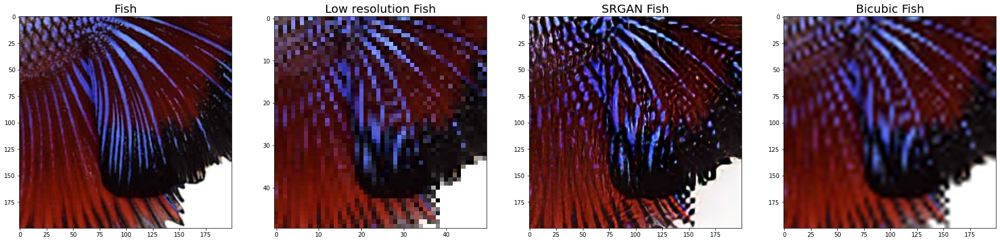

In [411]:
fig, axes = plt.subplots(figsize=(30, 16), nrows=1, ncols=4)
axs = axes.ravel()
for i, (image, title) in enumerate(zip(images, titles)):
    axs[i].imshow(image)
    axs[i].set_title(title, fontsize=20)

차례대로 

1. (1) 원본

2. (2) Bicubic으로 픽셀수를 줄인 이미지

3. (3) (2)를 SRGAN으로 복원한 이미지 

4. (4) (2)를 bicubic으로 복원한 이미지

In [412]:
print("Shape of the original picture: ", crop_fish.shape)
print("Shape of the Low resolution picture: ", lr_fish.shape)
print("Shape of the SRGAN picture: ", srgan_fish.shape)
print("Shape of the Bicubic picture: ", hr_bicubic_fish.shape)

Shape of the original picture:  (200, 200, 3)
Shape of the Low resolution picture:  (50, 50, 3)
Shape of the SRGAN picture:  (200, 200, 3)
Shape of the Bicubic picture:  (200, 200, 3)


### 5. 시각화

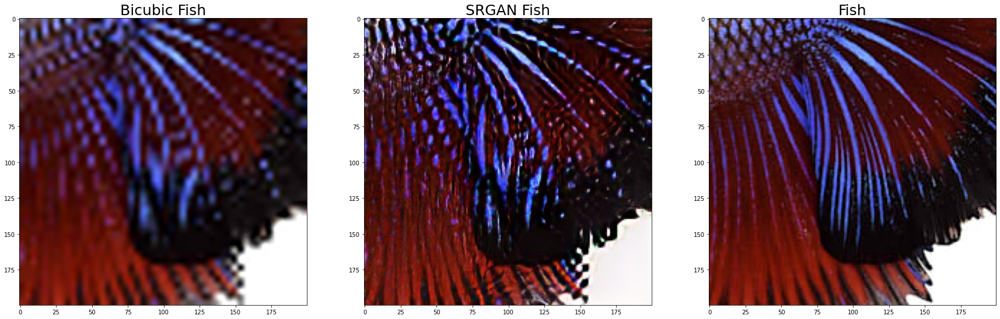

In [413]:
images = [hr_bicubic_fish, srgan_fish, crop_fish]
titles = ["Bicubic Fish", "SRGAN Fish", "Fish"]

fig, axes = plt.subplots(figsize=(30, 10), nrows=1, ncols=3)
axs = axes.ravel()

for i, (image, title) in enumerate(zip(images, titles)):
    axs[i].imshow(image)
    axs[i].set_title(title, fontsize=25)

### 6. 결과분석

In [414]:
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
print("BICUBIC's PSNR: ", peak_signal_noise_ratio(crop_fish, hr_bicubic_fish))
print("SRGAN's PSNR: ", peak_signal_noise_ratio(crop_fish, srgan_fish))

print("*" * 25)

print("BICUBIC's SSIM: ", structural_similarity(crop_fish, hr_bicubic_fish, multichannel=True))
print("SRGAN's SSIM: ", structural_similarity(crop_fish, srgan_fish, multichannel=True))

BICUBIC's PSNR:  19.014773624791292
SRGAN's PSNR:  16.045208683017172
*************************
BICUBIC's SSIM:  0.5937987954161988
SRGAN's SSIM:  0.44039159145141366


이번에는 이미지를 확인해보면 SRGAN이 더 나아보이지만 실제로 스코어는 Bicubic이 더 낫다고 합니다.

## 프로젝트 1-2

### 1. 이미지 불러오기

In [69]:
data_path = Path(os.getenv('HOME') + '/aiffel/exploration-16-gan-resolution/image')
file_path = data_path / 'lr_cat.jpeg'

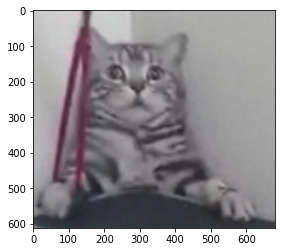

In [70]:
lr_cat = Image.open(file_path)
plt.imshow(lr_cat)

Convert the image to ndarray for applying resize via cv2.

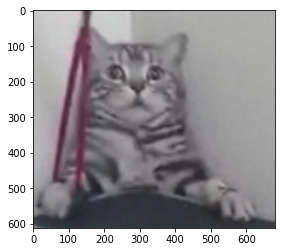

In [71]:
lr_cat = np.array(lr_cat)
# groot = groot[...,:3]
plt.imshow(lr_cat)

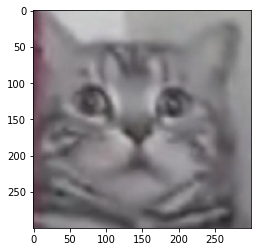

In [72]:
def crop(image, left_top, x=50, y=100):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1]+y), :]

crop_cat = crop(lr_cat, (50, 150), x=300, y=300)
plt.imshow(crop_cat)

이미지가 너무 커서 srgan에서 ResourceExhaustedError가 발생해 얼굴 부분만 잘라줬습니다.

### 2. `apply_srgan`

In [73]:
srgan_cat = apply_srgan(crop_cat)

In [74]:
srgan_cat.shape

(1200, 1200, 3)

### 3. Bicubic interpolation

In [75]:
bicubic_cat = cv2.resize(
    crop_cat,
    dsize=(crop_cat.shape[1] * 4, crop_cat.shape[0] * 4),
    interpolation=cv2.INTER_CUBIC
)

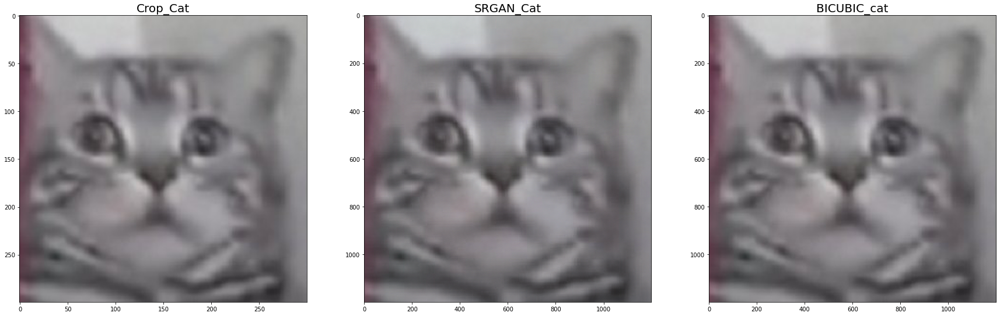

In [76]:
fig, axes = plt.subplots(figsize=(30, 16), nrows=1, ncols=3)
images = [crop_cat, srgan_cat, bicubic_cat]
titles = ["Crop_Cat", "SRGAN_Cat", "BICUBIC_cat"]
axs = axes.ravel()
for i, (image, title) in enumerate(zip(images, titles)):
    axs[i].imshow(image)
    axs[i].set_title(title, fontsize=20)

### 1. 이미지 불러오기

In [77]:
data_path = Path(os.getenv('HOME') + '/aiffel/exploration-16-gan-resolution/image')
file_path = data_path / 'lr_buildings.jpeg'

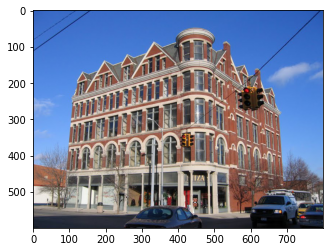

In [78]:
lr_building = Image.open(file_path)
plt.imshow(lr_building)

Convert the image to ndarray for applying resize via cv2.

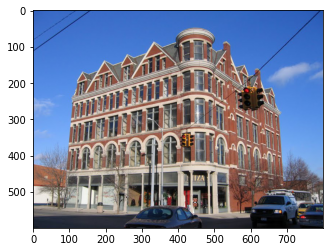

In [79]:
lr_building = np.array(lr_building)
# groot = groot[...,:3]
plt.imshow(lr_building)

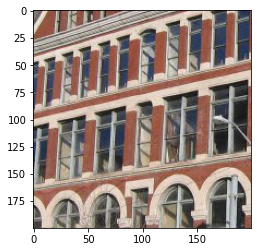

In [80]:
def crop(image, left_top, x=50, y=100):
    return image[left_top[0]:(left_top[0]+x), left_top[1]:(left_top[1]+y), :]

crop_building = crop(lr_building, (200, 150), x=200, y=200)
plt.imshow(crop_building)

In [81]:
crop_building.shape

(200, 200, 3)

### 2. `apply_srgan`

In [82]:
srgan_building = apply_srgan(crop_building)

In [83]:
srgan_building.shape

(800, 800, 3)

### 3. Bicubic interpolation

In [84]:
bicubic_building = cv2.resize(
    crop_building,
    dsize=(crop_building.shape[1] * 4, crop_building.shape[0] * 4),
    interpolation=cv2.INTER_CUBIC
)

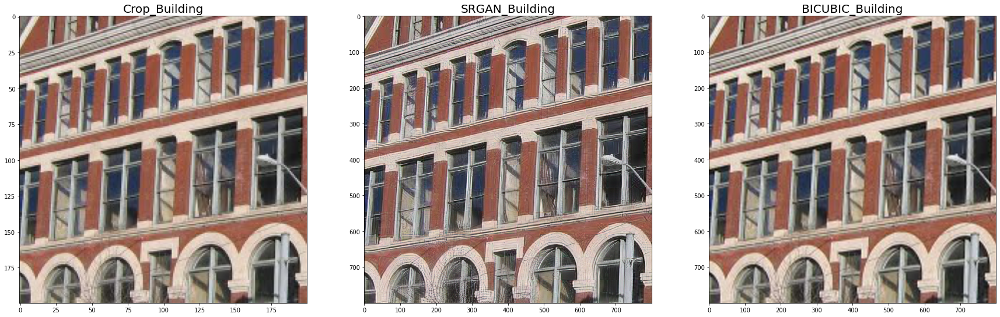

In [85]:
fig, axes = plt.subplots(figsize=(30, 16), nrows=1, ncols=3)
images = [crop_building, srgan_building, bicubic_building]
titles = ["Crop_Building", "SRGAN_Building", "BICUBIC_Building"]
axs = axes.ravel()
for i, (image, title) in enumerate(zip(images, titles)):
    axs[i].imshow(image)
    axs[i].set_title(title, fontsize=20)

SRGAN을 통해 복원한 가운데 이미지가 확연히 화질이 더 좋아졌음을 알 수 있습니다.

# 프로젝트 2 : SRGAN을 이용해 고해상도 gif 생성하기

In [168]:
!pip install imageio

You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [180]:
data_path = os.getenv('HOME') + '/aiffel/exploration-16-gan-resolution/image'
file_path = os.path.join(data_path, 'city_night_lr.gif')

In [183]:
import cv2

gif = cv2.VideoCapture(file_path)

isTrue = True
frames = []
while isTrue:
    isTrue, frame = gif.read()
    if isTrue:
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)
        
print("frame 수: ", len(frames))
print("frame 크기 :", (frames[0].shape))

frame 수:  8
frame 크기 : (255, 500, 3)


In [185]:
def apply_bicubic(img):
    
    bicubic_img = cv2.resize(
        img,
        dsize=(img.shape[1], img.shape[0]),
        interpolation=cv2.INTER_CUBIC)
    
    return bicubic_img

In [186]:
srgan_frames = [apply_srgan(frame) for frame in frames]
bicubic_frames = [apply_bicubic(frame) for frame in frames]

In [188]:
import imageio
imageio.mimsave("city_night_srgan.gif", srgan_frames)
imageio.mimsave("city_night_bicubic.gif", bicubic_frames)

![ex_screenshot](./image/lr.gif)
저화질

![ex_screenshot](./image/srgan.gif)
srgan

![ex_screenshot](./image/bicubic.gif)
bicubic

## 소감

다양한 이미지를 통해 확인해본 결과, DIV2K의 데이터셋과 유사하지 않은 데이터를 사용하지 않으니 쉽게 고화질로 변형되지 않았습니다. 오히려 GAN이라는 특성에 맞게 복원(Upsampling)을 하면서 오히려 원래 없었던 패턴들을 만들어내면서 실제 이미지와 다른 모습을 많이 만들어냈습니다.

저화질 이미지 자체에서 출발을 했을 때에는 고화질로 복원되는 결과를 보여주기도 했습니다.

추가적으로 SRGAN에 대해 더 공부를 하게 된다면 저화질 CCTV 복원등에도 사용할 수 있을 것 같습니다.